# Week 3 — Day 2: Grad-CAM on the BLIP vision encoder

Tasks:
- Set up Captum; apply Grad-CAM on the BLIP vision encoder for the curated examples
- Visualize which image regions the model attended to when generating each word/caption

Deliverable: notebook with Grad-CAM heatmap overlays for all curated examples.

## Why a manual implementation, not `captum.attr.LayerGradCam` directly

BLIP's vision encoder is a ViT, not a CNN -- there's no conv "feature map" with a `(C, H, W)`
layout. Its transformer blocks output `(batch, num_tokens, hidden_dim)` (1 CLS token + 576 patch
tokens for BLIP-base's 384x384 input at patch size 16, i.e. a 24x24 grid). Captum's `LayerGradCam`
assumes the standard CNN axis order, so instead we implement the same Grad-CAM formula by hand,
substituting "patch tokens" for "spatial locations" and "hidden dim" for "channels" -- this is the
standard adaptation used for Grad-CAM on Vision Transformers:

1. Hook the last vision encoder block's output, `(1, 577, 768)`.
2. Backward from a target scalar (caption log-likelihood, or a single token's log-prob).
3. `weights = mean(gradients over the 576 patch tokens)` -> `(768,)` (like average-pooling
   gradients over H,W in CNN Grad-CAM, but over patches here).
4. `cam[patch] = ReLU(sum_over_hidden_dim(weights * activation[patch]))` -> `(576,)`.
5. Reshape to the 24x24 grid and upsample to the image size for the overlay.

### 1. Load the fine-tuned model and curated examples

In [1]:
import os
import math
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from PIL import Image

from transformers import BlipProcessor, BlipForConditionalGeneration

processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("../results/config_A_checkpoint")
model.eval()

VISION_LAYER = model.vision_model.encoder.layers[-1]   # last block, full 24x24 patch resolution

xai_dir = '../data/xai_examples'
curated_df = pd.read_csv(os.path.join(xai_dir, 'curated_examples.csv'))
img_dir = os.path.join(xai_dir, 'images')
curated_df

Loading weights:   0%|          | 0/473 [00:00<?, ?it/s]

[transformers] The tied weights mapping and config for this model specifies to tie text_decoder.cls.predictions.bias to text_decoder.cls.predictions.decoder.bias, but both are present in the checkpoints with different values, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning.


[transformers] The tied weights mapping and config for this model specifies to tie text_decoder.bert.embeddings.word_embeddings.weight to text_decoder.cls.predictions.decoder.weight, but both are present in the checkpoints with different values, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning.


,image,predicted_caption,best_ground_truth,rougeL,bucket
0,1526181215_c1a94325ae.jpg,a brown dog jumping into the water.,a dog jumps into the water .,0.923077,good
1,2541104331_a2d65cfa54.jpg,a brown dog splashes through the water.,A brown dog splashing through water .,0.923077,good
2,2741051940_89fb6b2cee.jpg,a black and white dog is playing with a plasti...,A white dog is playing with a plastic bag .,0.900000,good
3,3154813159_58a195236d.jpg,a brown and white dog is standing on its hind ...,The brown and white dog is standing up on its ...,0.869565,good
4,2708686056_1b8f356264.jpg,a girl in a blue swimsuit is running into the ...,A girl in a blue swimsuit walks into the ocean .,0.857143,good
5,2326730558_75c20e5033.jpg,two brown dogs are playing in the snow.,Two dogs play in the snow .,0.857143,good
6,3091912922_0d6ebc8f6a.jpg,a brown dog is running with a yellow ball in i...,A dog runs with a yellow toy in its mouth .,0.818182,good
7,2332986053_864db84971.jpg,a bearded bearded bearded bearded bearded bear...,A man wearing a helmet and sunglasses smiles .,0.055556,poor
8,3561543598_3c1b572f9b.jpg,a man in a white shirt and a man in a black an...,A group of men wearing uniforms with hats gath...,0.222222,poor
9,3280672302_2967177653.jpg,a man and a woman are posing for the camera.,a boy carries a teenager on his back .,0.222222,poor


### 2. Grad-CAM implementation

In [2]:
def compute_gradcam(pixel_values, input_ids, target="sequence"):
    """Grad-CAM over the last ViT block.

    target="sequence": scalar = -loss (teacher-forced on input_ids), explains the whole caption.
    target=int i:      scalar = log-prob of input_ids[i+1] given input_ids[:i+1], explains one word.
    """
    activations = {}

    def hook(module, inp, out):
        out.retain_grad()
        activations["value"] = out

    handle = VISION_LAYER.register_forward_hook(hook)
    model.zero_grad()

    if target == "sequence":
        outputs = model(pixel_values=pixel_values, input_ids=input_ids, labels=input_ids)
        scalar = -outputs.loss
    else:
        outputs = model(pixel_values=pixel_values, input_ids=input_ids)
        log_probs = F.log_softmax(outputs.logits[0, target, :], dim=-1)
        target_token_id = input_ids[0, target + 1]
        scalar = log_probs[target_token_id]

    scalar.backward()
    handle.remove()

    acts = activations["value"]
    grads = acts.grad
    patch_acts = acts[0, 1:, :].detach()   # drop CLS token
    patch_grads = grads[0, 1:, :]

    weights = patch_grads.mean(dim=0)
    cam = torch.relu((weights.unsqueeze(0) * patch_acts).sum(dim=1))

    grid = int(math.sqrt(cam.shape[0]))
    cam = cam.reshape(grid, grid)
    if cam.max() > 0:
        cam = cam / cam.max()
    return cam.detach().numpy()


def overlay_heatmap(image, cam, alpha=0.5):
    cam_resized = np.array(Image.fromarray((cam * 255).astype(np.uint8)).resize(image.size, Image.BILINEAR))
    heatmap = plt.cm.jet(cam_resized / 255.0)[:, :, :3]
    img_arr = np.array(image.resize((cam_resized.shape[1], cam_resized.shape[0]))) / 255.0
    return (1 - alpha) * img_arr + alpha * heatmap

### 3. Whole-caption Grad-CAM for every curated example

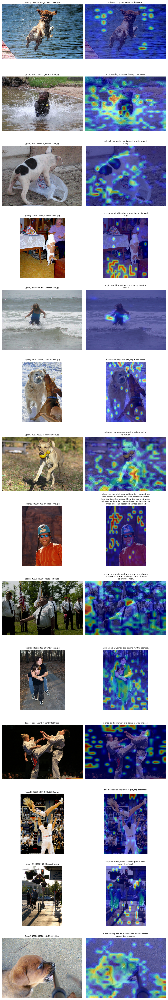

In [3]:
n = len(curated_df)
fig, axes = plt.subplots(n, 2, figsize=(10, 4.2 * n))

for row_idx, (_, row) in enumerate(curated_df.iterrows()):
    image = Image.open(os.path.join(img_dir, row["image"])).convert("RGB")
    pixel_values = processor(images=image, return_tensors="pt").pixel_values
    input_ids = processor(text=row["predicted_caption"], return_tensors="pt").input_ids

    cam = compute_gradcam(pixel_values, input_ids, target="sequence")
    overlay = overlay_heatmap(image, cam)

    axes[row_idx, 0].imshow(image)
    axes[row_idx, 0].set_title(f"[{row['bucket']}] {row['image']}", fontsize=8)
    axes[row_idx, 0].axis("off")

    axes[row_idx, 1].imshow(overlay)
    caption_wrapped = "\n".join([row["predicted_caption"][i:i+45] for i in range(0, len(row["predicted_caption"]), 45)])
    axes[row_idx, 1].set_title(caption_wrapped, fontsize=8)
    axes[row_idx, 1].axis("off")

plt.tight_layout()
os.makedirs('../data/xai_examples/gradcam', exist_ok=True)
plt.savefig('../data/xai_examples/gradcam/all_examples_gradcam.png', dpi=100)
plt.show()

### 4. Per-word Grad-CAM: two case studies

- The image BLIP's **zero-shot** model miscaptioned as "a small pig" in Week 2 -- fine-tuning fixed
  it to "dog". Per-word Grad-CAM shows what the *fine-tuned* model looked at for the key word "dog".
- The **repetition-loop** failure ("a bearded bearded bearded...") -- per-word Grad-CAM on the
  repeated token shows whether the model is still looking at the image at all, or stuck ignoring it.

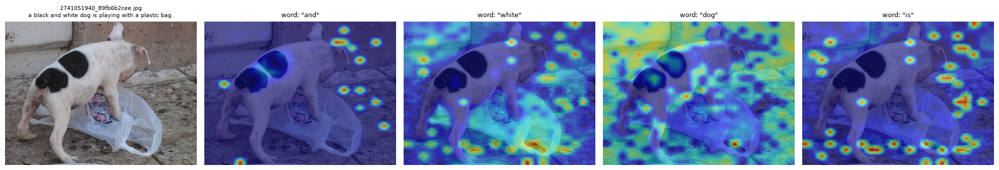

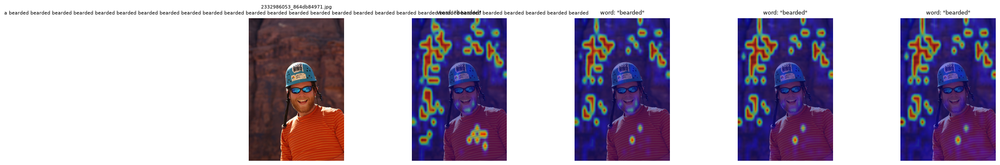

In [4]:
CASE_STUDIES = {
    "fixed_dog_case": "2741051940_89fb6b2cee.jpg",
    "repetition_loop_case": "2332986053_864db84971.jpg",
}

for case_name, img_name in CASE_STUDIES.items():
    row = curated_df[curated_df["image"] == img_name].iloc[0]
    image = Image.open(os.path.join(img_dir, img_name)).convert("RGB")
    pixel_values = processor(images=image, return_tensors="pt").pixel_values
    input_ids = processor(text=row["predicted_caption"], return_tensors="pt").input_ids
    tokens = [processor.tokenizer.decode([t]) for t in input_ids[0]]

    # pick up to 4 content-word positions to visualize (skip special tokens/short function words)
    content_positions = [i for i, t in enumerate(tokens[:-1]) if len(t) > 2 and t.isalpha()][:4]

    fig, axes = plt.subplots(1, len(content_positions) + 1, figsize=(4 * (len(content_positions) + 1), 4))
    axes[0].imshow(image)
    axes[0].set_title(f"{img_name}\n{row['predicted_caption']}", fontsize=8)
    axes[0].axis("off")

    for ax, pos in zip(axes[1:], content_positions):
        cam = compute_gradcam(pixel_values, input_ids, target=pos)
        overlay = overlay_heatmap(image, cam)
        ax.imshow(overlay)
        ax.set_title(f'word: "{tokens[pos + 1]}"', fontsize=9)
        ax.axis("off")

    plt.tight_layout()
    plt.savefig(f'../data/xai_examples/gradcam/{case_name}_per_word.png', dpi=100)
    plt.show()

### Observations

- **"Good" examples**: Grad-CAM concentrates tightly on the actual subject -- dogs, the ball, the
  girl in the water -- matching what the caption describes. Attention localization and caption
  correctness track each other closely here.
- **Most "poor" examples are localization-correct but description-wrong**: e.g. the
  cheerleaders-captioned-as-"basketball players" and the boy-carrying-a-teenager captioned as
  "posing for the camera" both show Grad-CAM correctly centered on the people involved. The model
  *looked at the right thing* and still got the specific action/count wrong -- these are language
  generation/fine-grained recognition failures, not vision-attention failures.
- **The repetition-loop case is the interesting exception**: per-word Grad-CAM on all 4 repeated
  "bearded" tokens (see case study above) shows **nearly identical heatmaps concentrated on
  background rock texture**, not on the man's face where a beard would actually be. Once the model
  entered the repetition loop, it stopped attending to the image in any word-specific way -- it's
  reusing the same (wrong) region regardless of which repeated token it's generating. This points to
  a **decoding-time degeneration** (a known failure mode of greedy/near-greedy autoregressive
  decoding without a repetition penalty), not a vision-encoder or fine-tuning problem. Actionable
  fix: add `repetition_penalty` or `no_repeat_ngram_size` to `generate()`, rather than more
  fine-tuning or a different vision backbone.
- **The fixed "dog" case** (previously miscaptioned "a small pig" zero-shot) shows sharp,
  word-appropriate attention on the dog's body for "dog" and on the dog+bag region for "white" and
  "and" -- consistent with fine-tuning having sharpened the vision-language grounding, not just
  memorized the word "dog" independent of the image.